# NP, NPC and the Cook Levin Theorem

Dependencies for this notebook: `graphviz` executable installed on the system and on the path, [networkx](https://anaconda.org/anaconda/networkx)   and [graphviz python](https://anaconda.org/conda-forge/python-graphviz) anaconda packages. (See [here](https://graphviz.readthedocs.io/en/stable/index.html) for the documentation of the latter package.)

Please run the utility code at the bottom of this notebook first.

You should be able to upload this notebook to the JupyterHub instance on canvas.

__comment:__ In this notebook I use `x_17` and not `x17` for 3SAT and 3NAND formula to be more consistent with our notation for NAND. This is of course not very important.

In [9]:
# configure RISE plugin
from traitlets.config.manager import BaseJSONConfigManager
path = "C:/Users/Boaz/.jupyter/nbconfig"
cm = BaseJSONConfigManager(config_dir=path)
cm.update("livereveal", {
              "theme": "beige",
              "transition": "none",
              "start_slideshow_at": "selected",
              "scroll": True,
})

{'scroll': True,
 'start_slideshow_at': 'selected',
 'theme': 'beige',
 'transition': 'none'}

 _Useful unicode symbols:_ φ   ∨   ∧   ¬   ≠    Ψ

__Announcements:__ quiz grade, fill survey until tonight

probability is coming...

In [73]:
%%html
<iframe src="http://free.timeanddate.com/countdown/i5vf6j5p/n43/cf11/cm0/cu4/ct1/cs1/ca0/co0/cr0/ss0/cac09f/cpc09f/pct/tcfff/fs100/szw576/szh243/iso2017-10-31T10:07:00" allowTransparency="true" frameborder="0" width="177" height="35"></iframe>'

In [11]:
%pdb

Automatic pdb calling has been turned ON


In [12]:
last_time = Digraph()
last_time.edges([("3SAT","Quadratic Equations"),("3SAT","Independent Set"),("3SAT","Longest Path"),("Independent Set","Maximum Cut")])

today = Digraph()
today.edges([("3SAT","Quadratic Equations"),("3SAT","Independent Set"),("3SAT","Longest Path"),("Independent Set","Maximum Cut")])
today.edges([("Quadratic Equations","3SAT"),("Independent Set","3SAT"),("Longest Path","3SAT"),("Maximum Cut","3SAT")])

cooklevin = Digraph()
cooklevin.edges([("F in NP","NANDSAT"),("NANDSAT","3NAND"),("3NAND","3SAT")])

cooklevin1 = Digraph()
cooklevin1.edge("F in NP","NANDSAT",color="red",pendwidth="2")
cooklevin1.edges([("NANDSAT","3NAND"),("3NAND","3SAT")])

cooklevin2 = Digraph()
cooklevin2.edge("NANDSAT","3NAND",color="red",pendwidth="2")
cooklevin2.edges([("F in NP","NANDSAT"),("3NAND","3SAT")])

cooklevin3 = Digraph()
cooklevin3.edge("3NAND","3SAT",color="red",pendwidth="2")
cooklevin3.edges([("F in NP","NANDSAT"),("NANDSAT","3NAND")])

combined = Digraph()
combined.edges([("F in NP","NANDSAT"),("NANDSAT","3NAND"),("3NAND","3SAT"),("3SAT","Independent Set"),("Independent Set","Maximum Cut")])

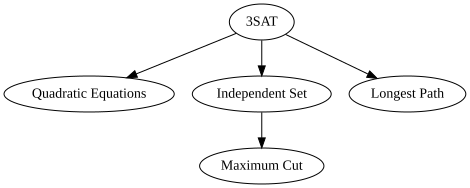

In [13]:
last_time

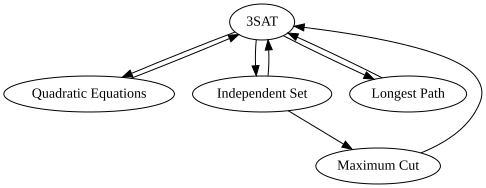

In [14]:
today

## The class $\mathbf{NP}$

"Efficiently verifiable problems"

__Def:__ $F \in \mathbf{NP}$ iff for all $x\in \{0,1\}^*$,

$$F(x)=1 \Leftrightarrow \exists y\in \{0,1\}^{p(n)} \text{s.t.} V(x,y)=1 $$

__Problem:__ Prove that $ISET \in \mathbf{NP}$

__Question:__ Which of the following problems is __not__ in $\mathbf{NP}$?

__a__ $MAXCUT$

__b__ $SHORTESTPATH$

__c__ $LONGESTPATH$

__d__ $HALT_{2^{2^n}}$

__Thm__ $\mathbf{P} \subseteq \mathbf{NP} \subseteq \mathbf{EXP}$

__Proof idea:__ $\mathbf{P} \subseteq \mathbf{NP}$ since can use empty solution.

$\mathbf{NP} \subseteq \mathbf{EXP}=TIME(2^{poly(n)})$ since can enumerate over all solutions.

__Def:__ $G$ is _$\mathbf{NP}$-complete_ if $G\in\mathbf{NP}$ and  $\forall F\in \mathbf{NP}$, $F \leq_p G$

__Cook-Levin Theorem:__ $3SAT$ is $\mathbf{NP}$ complete

__History:__ 

* 1971: Steve Cook proves CLT. (SAT for general formulas)
* 1972: Dick Karp gives first taste of reach of $\mathbf{NP}$-completeness: 21 natural examples.
* 1971-3: Across iron curtain Leonid Levin proves CLT and gives 6 $\mathbf{NP}$-completeness results

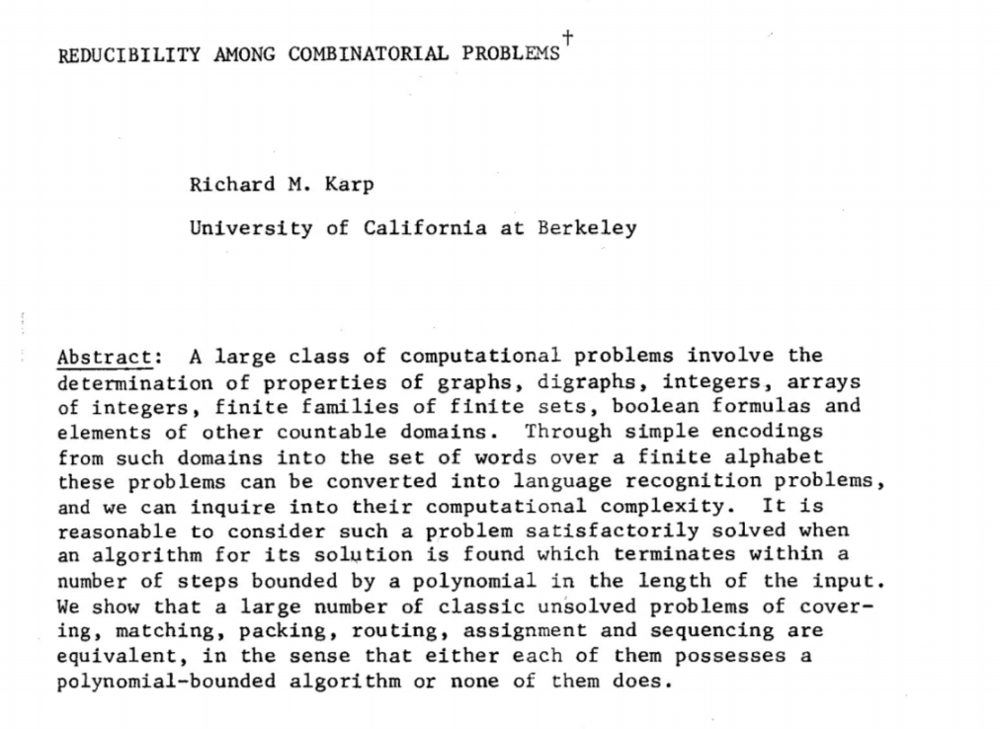

In [15]:
Image('karp_abstract.png')

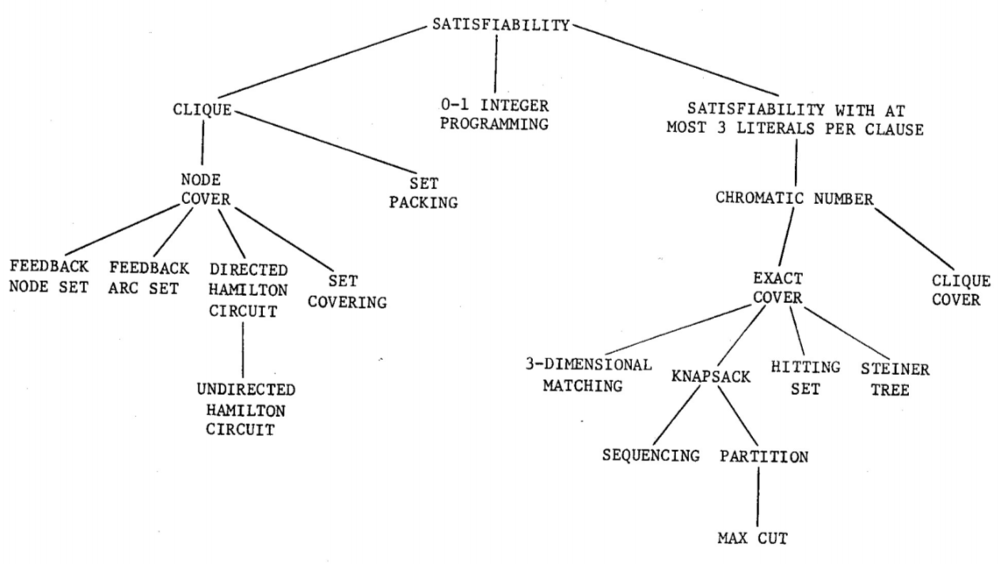

In [16]:
Image('karp_problems.png')

## Karp's problems

* CNF Satisfiability / 3SAT
* Clique  (independent Set)
* Max cut / partition
* Integer programming
* Set cover / hitting set / exact cover/ clique cover
* Vertex cover
* Feedback node set, feedback arc set
* (un)directed Hamiltonian cycle 
* Graph coloring
* Steiner tree
* Subset sum (knapsack) / set packing
* 3-dimensional matching
* Job sequencing

__Cook Levin Thm:__ For every $F\in\mathbf{NP}$, $F \leq 3SAT$

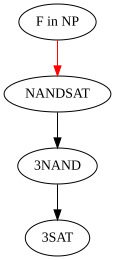

In [17]:
cooklevin1

## NANDSAT

__Input:__ $Q \in \{0,1\}^*$: NAND program of $n$ inputs and $1$ output

__Output:__ $1$ iff $\exists y\in \{0,1\}^n$ s.t. $Q(y)=1$.

__Problem:__ Prove that $NANDSAT \in \mathbf{NP}$

In [18]:
xor5 = r'''u   := x_0 NAND x_1
v   := x_0 NAND u
w   := x_1 NAND u
s   := v   NAND w
u   := s   NAND x_2
v   := s   NAND u
w   := x_2 NAND u
s   := v   NAND w
u   := s   NAND x_3
v   := s   NAND u
w   := x_3 NAND u
s   := v   NAND w
u   := s   NAND x_4
v   := s   NAND u
w   := x_4 NAND u
y_0 := v   NAND w'''

In [19]:
and5 = r'''tmp := x_0 NAND x_1
s   := tmp NAND tmp
tmp := x_2 NAND s
s   := tmp NAND tmp
tmp := x_3 NAND s
s   := tmp NAND tmp
tmp := x_4 NAND s
y_0 := tmp NAND tmp'''

In [20]:
# Gets as input a NAND program and a table of values of variables. 
# Runs an iteration of the program, updating the values of the variables as it proceeds
def NANDinterpeter(prog,variables):
    for line in prog.rstrip('\n').split('\n'):
        (var1,_,var2,__,var3) = line.split()
        variables[var1] = 1-variables.get(var2,0)*variables.get(var3,0)
        
# p.s. This code is a bit brittle: sensitive to spaces, comments, and other issues.

# Evaluate a given NAND program on a given input
def EVAL(prog,x):
    avars = {}
    for i in range(len(x)): avars[f'x_{i}'] = int(x[i])
    NANDinterpeter(prog,avars)
    return avars['y_0']

# Return the number of inputs of a given program
def numinputs(Q):
    for n in range(3*len(Q),0,-1):
        if Q.find(f'x_{n}')>= 0: return n+1
    raise Exception

In [21]:
EVAL(and5,"11111")

1

__Thm:__ $\forall F \in \mathbf{NP}$, $F \leq_p NANDSAT$

__Proof idea:__ $TIME(T(n)) \subseteq TIME_{++}(T(n)^{O(1)}) \subseteq^* SIZE(T(n)^{O(1)})$

__Proof:__ Let $F \in \mathbf{NP}$ and $P_F$  NAND++ prog, $T$ poly s.t. 

$$\forall x\in \{0,1\}^n, F(x)=1 \Leftrightarrow \exists_{y\in \{0,1\}^{T(n)}} P_F(xy)=1$$

Find $O(T(n))$ sized NAND $Q$  computing $y \mapsto P_F(xy)$

$NANDSAT(Q) = F(x)$

In [22]:
andpp = r'''y_0 := flag NAND flag
notx   := x_i NAND x_i
nottmp := validx_i NAND notx
notflag  := flag NAND flag
flag := notflag NAND nottmp
halt := validx_i NAND validx_i
loop := halt NAND halt
'''

In [23]:
def pref(P):
    return r'''notx_0 := x_0 NAND x_0
one := x_0 NAND notx_0
zero := one NAND one
'''+P

In [24]:
andpp = pref(andpp)
print(andpp)

notx_0 := x_0 NAND x_0
one := x_0 NAND notx_0
zero := one NAND one
y_0 := flag NAND flag
notx   := x_i NAND x_i
nottmp := validx_i NAND notx
notflag  := flag NAND flag
flag := notflag NAND nottmp
halt := validx_i NAND validx_i
loop := halt NAND halt



In [25]:
# make the programs "nice": contain one and zero variables
xor5 = pref(xor5)
and5 = pref(and5)

In [26]:
import math

# Returns the value of the index variable i in  iteration number k
def index(k):
    r = math.floor(math.sqrt(k+1/4)-1/2)
    return (k-r*(r+1) if k <= (r+1)*(r+1) else (r+1)*(r+2)-k)

In [27]:
[index(i) for i in range(17) ]

[0, 1, 0, 1, 2, 1, 0, 1, 2, 3, 2, 1, 0, 1, 2, 3, 4]

In [28]:
# Gets as input a NAND++ program and an input (as string) and returns the evaluation of the program on this input
# Works by repeatedly calling NAND
def EVALPP(prog,x):
    n = len(x)
    variables = {}
    for i in range(n):
        variables[f'x_{i}']=int(x[i])
        variables[f'validx_{i}']=1
    k=0
    while True:
        NANDprog = prog.replace( '_i',f'_{index(k)}')
        NANDinterpeter(NANDprog,variables)
        if variables.get('loop',0)==0: break
        k += 1
    
    return variables.get('y_0',0) # assume one bit output

In [29]:
EVALPP(andpp,"110011")

0

In [30]:
#Input: NAND++ "simple" prog P, time bound T, input length n
#Output: n-input NAND program of T|P| lines computing same function
def expand(P,T,n):
    result = ""
    for k in range(T):
        i=index(k)
        validx = ('one' if i<n else 'zero')
        inp    = ('x_i' if i<n else 'zero')
        result += P.replace('validx_i',validx).replace('x_i',inp).replace( '_i',f'_{i}')
    return result

In [31]:
# "hardwire" an input x to a NAND program Q
# return Q' s.t. Q'(y)=Q(xy)
def hardwire(Q,x):
    n = len(x)
    for i in range(n): Q = Q.replace(f'x_{i}',('one' if x[i]=='1' else 'zero'))
    
    for i in range(n,len(Q)): # move x_n,x_n+1,.... to x_0,x_1,...
        Q = Q.replace(f'x_{i}',f'x_{i-n}')
    return Q

In [32]:
# reduce F in NP to NANDSAT
# Input: x,T and and a NAND++ prog P s.t. 
#       F(x)=1 iff there exists y in {0,1}^m s.t. P(xy)=1 within T steps
# Output: Q s.t. NANDSAT(Q)=F(x)
def NP2NANDSAT_(P,T,m,x):
    Q = expand(P,T,len(x)+m)
    return hardwire(Q,x)

In [33]:
# This is the version of the function above that keeps track of y
# if it is given as extra input. Otherwise behaves identically.
#
# reduce F in NP to NANDSAT
# Input: x,T and and a NAND++ prog P s.t. 
#       F(x)=1 iff there exists y in {0,1}^m s.t. P(xy)=1 within T steps
# Output: Q s.t. NANDSAT(Q)=F(x)
def NP2NANDSAT(P,T,m,x,y=""):
    if y and len(y) != m: raise Exception
    Q = expand(P,T,len(x)+m)
    Q = hardwire(Q,x)
    return (Q,y) if y else Q

In [80]:
# print(andpp)
# EVALPP(andpp,"11101")
# Q = NP2NANDSAT(andpp,17,3,"11")
# print(Q)
# numvars(Q)
EVAL(Q,"111")

1

In [71]:
EVAL(Q,"111")

1

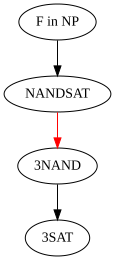

In [36]:
cooklevin2

## 3NAND

__Input:__ $\psi \in \{0,1\}^*$ representing 3NAND formula of form $(x_i = x_j NAND x_k) \wedge \cdots$

__Output:__ $1$ iff $\exists x\in \{0,1\}^*$ s.t. $\psi(x)=1$. 

In [37]:
Ψ = "(x_0 = x_1 NAND x_2 ) ∧ (x_3 = x_2 NAND x1 ) ∧ (x_1 = x_2 NAND x_3 ) "

In [38]:
# Evaluate 3CNAND Ψ on assignment x 
# Both are represented as strings
def eval3NAND(Ψ,x):

    def varval(v):
        return  int(x[int(v[2:])]) # assume vars are x_###
    
    for (v0,v1,v2) in getclauses(Ψ):
        if  varval(v0) != 1-varval(v1)*varval(v2): return False
    
    return True


In [39]:

# Clause list of a 3CNF/3NAND formula  φ
def getclauses(φ):
    clauses =  φ.split("∧")
    res = []
    for c in clauses:
        (v0,_,v1,_,v2) = c.strip()[1:-1].split()
        res.append((v0.strip(),v1.strip(),v2.strip()))
    return res
    

# number of variables of a formula φ
def numvars(φ):
    for n in range(len(φ)-1,0,-1):
        if φ.find(f'x_{n}')>= 0: return n+1
    raise Exception


__Thm:__ $NANDSAT \leq_p 3NAND$

__Proof:__ Variables $x_0,\ldots,x_{n-1}$ for inputs. Variables $x_n,\ldots, x_{n+m-1}$ for lines.

Line `foo := bar NAND blah` mapped to $x_i = x_j NAND x_k$

In [40]:
# Reduce NANDSAT to 3NAND
# Input: NAND prog Q
# Output: 3NAND formula Ψ
#        s.t. Ψ satisfiable iff Q is
def NANDSAT23NAND_(Q):
    n = numinputs(Q); m = len(Q); varidx = {}; Ψ = ''
    #varidx[u] is index corresponding to last value of u
    
    ZERO = n+2 # assume "zero" is written to in line 2
    
    for i in range(n): varidx[f'x_{i}'] = i # setup x_0...x_n-1
    
    # vars x_n ... x_n+m-1 correspond to lines
    j= n
    for line in Q.rstrip('\n').split('\n'): 
        (u,_,v,_,w) = line.split() # line is "u := v NAND w"
        
        #add constraint x_j = x_l NAND x_k, where k, l correspond to last     
        #lines v and w were written to
        Ψ += f"(x_{j} = x_{varidx.get(v,ZERO)} NAND x_{varidx.get(w,ZERO)}) ∧ "
        varidx[u] = j # update last line u is written to
        j += 1
    
    # output should be one
    Ψ += f'(x_{varidx["y_0"]} = x_{ZERO} NAND x_{ZERO})'
    
    return Ψ

In [41]:
NANDSAT23NAND_(xor5)

'(x_5 = x_0 NAND x_0) ∧ (x_6 = x_0 NAND x_5) ∧ (x_7 = x_6 NAND x_6) ∧ (x_8 = x_0 NAND x_1) ∧ (x_9 = x_0 NAND x_8) ∧ (x_10 = x_1 NAND x_8) ∧ (x_11 = x_9 NAND x_10) ∧ (x_12 = x_11 NAND x_2) ∧ (x_13 = x_11 NAND x_12) ∧ (x_14 = x_2 NAND x_12) ∧ (x_15 = x_13 NAND x_14) ∧ (x_16 = x_15 NAND x_3) ∧ (x_17 = x_15 NAND x_16) ∧ (x_18 = x_3 NAND x_16) ∧ (x_19 = x_17 NAND x_18) ∧ (x_20 = x_19 NAND x_4) ∧ (x_21 = x_19 NAND x_20) ∧ (x_22 = x_4 NAND x_20) ∧ (x_23 = x_21 NAND x_22) ∧ (x_23 = x_7 NAND x_7)'

In [42]:
# Version of input above that keeps track of satisfying assignment y if given
#
# Reduce NANDSAT to 3NAND
# Input: NAND prog Q
# Output: 3NAND formula Ψ
#        s.t. Ψ satisfiable iff Q is
def NANDSAT23NAND(Q,y=""):
    n = numinputs(Q)
    m = len(Q.rstrip('\n').split('\n'))
    z = ["0"]*(m+n)
    varidx = {}
    Ψ = ''
    ZERO = n+2 # assume "zero" is written to in line 2
    
    for i in range(n): 
        varidx[f'x_{i}'] = i
        if y: z[i]=y[i]
    
    lastoutput = 0
    j= n
    for line in Q.rstrip('\n').split('\n'):
        if Ψ: Ψ += ' ∧ '
        (u,_,v,_,w) = line.split()
        if u=='y_0': lastoutput = j
        k = varidx.get(v,ZERO)
        l = varidx.get(w,ZERO)
        Ψ += f"(x_{j} = x_{k} NAND x_{l})"
        z[j] = "0" if z[k]=="1" and z[l]=="1" else "1"
        varidx[u] = j
        j += 1
    
    Ψ += f' ∧  (x_{lastoutput} = x_{ZERO} NAND x_{ZERO})'
    
    return  (Ψ, "".join(z)) if y else Ψ

In [85]:
(Ψ,y) = NANDSAT23NAND(Q,"111")
# len(Q.split('\n'))
y
# NANDSAT23NAND(Q,"111")

'11111010110010101011001010101100101010110010101011001010101100101010110010101011001010101100101010110010101011001010101100101010110010101011001010101100101010110010101011001'

In [87]:
eval3NAND(*NANDSAT23NAND(Q,"101"))

False

In [45]:
eval3NAND(*NANDSAT23NAND(*NP2NANDSAT(andpp,17,3,"11","111")))

True

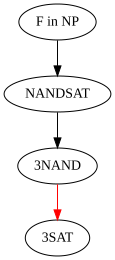

In [46]:
cooklevin3

## 3SAT 

__Input:__ 3CNF formula:  AND of $m$ _clauses_.   Clause = OR of three _literals_. Literal = variable or its negation.

__Goal:__ Output 1 iif formula _satisfiable_.

In [47]:
φ = "(x_0 ∨ ¬x_3 ∨ x_2 ) ∧ (¬x_0 ∨ x_1 ∨ ¬x_2 ) ∧ (x_1 ∨ x_2 ∨ ¬x_3 )  "

In [48]:
# Evaluate 3CNF φ on assignment x 
# Both are represented as strings
def evalcnf(φ,x):

    def varval(v):
        return (1-int(x[int(v[3:])])  if v[0]=="¬" else int(x[int(v[2:])]))
    
    for (v0,v1,v2) in getclauses(φ):
        # print(c+str([varval(v0),varval(v1),varval(v2)]))
        if not varval(v0)+varval(v1)+varval(v2): return False
    
    return True

# Clause list of a 3CNF φ
def getclauses(φ):
    clauses =  φ.split("∧")
    res = []
    for c in clauses:
        (v0,_,v1,_,v2) = c.strip()[1:-1].split()
        res.append((v0.strip(),v1.strip(),v2.strip()))
    return res
    

# number of variables of a formula φ
def numvars(φ):
    for n in range(len(φ)-1,0,-1):
        if φ.find('x_'+str(n))>= 0: return n+1
    raise Exception


In [49]:
numvars(φ)

4

In [50]:
evalcnf(φ,"0101")

False

In [51]:
evalcnf(φ,"1000")

True

__Thm:__ $3NAND \leq_p 3SAT$

__Proof:__ $a = b$  $NAND$ $c$  iff  $(\neg a \vee \neg b \vee \neg c) \wedge (a \vee b) \wedge (a \vee c)$

In [52]:
# Reduce 3NAND to 3SAT
# Input: 3NAND formula Ψ
# Output: 3CNF formula φ
#        s.t.  φ satisfiable iff Ψ is
def NAND23SAT_(Ψ):
    φ = ""
    for (a,b,c) in getclauses(Ψ):
        φ += f'(¬{a} ∨ ¬{b} ∨ ¬{c}) ∧ ({a} ∨ {b}  ∨ {b})   ∧ ({a}  ∨  {c} ∨ {c})  ∧'
    return φ[:-1] # chop off redundant ∧

In [53]:
# Same as above but keeping track of assignment
def NAND23SAT(Ψ,y=""):
    φ = ""
    for (a,b,c) in getclauses(Ψ):
        φ += f'(¬{a} ∨ ¬{b} ∨ ¬{c}) ∧ ({a} ∨ {b}  ∨ {b})   ∧ ({a}  ∨  {c} ∨ {c})  ∧'
    return (φ[:-1],y) if y else φ[:-1] # chop off redundant ∧

In [92]:
NAND23SAT(NANDSAT23NAND(Q))
len(getclauses(NAND23SAT(NANDSAT23NAND(Q))))
# evalcnf(*NAND23SAT(*NANDSAT23NAND(Q,"111")))

513

In [55]:
evalcnf(*NAND23SAT(*NANDSAT23NAND(*NP2NANDSAT(andpp,17,3,"11","101"))))

False

In [56]:
# Reduction φ ↦ G
def SAT2IS_(φ):
    n = numvars(φ) 
    G =Graph(engine='neato')
    
    # add pairs "x_i=0" and "x_i=1"
    for i in range(n): G.edge(f'x_{i}=0',f'x_{i}=1')
        
    # map "x_7" with index 5 to "5)x_7≠0", "¬x_12" with index 6 to "6)x_12≠1"
    def nodename(v,c): return str(c)+')'+(v[1:]+"≠1" if v[0]=="¬" else v+"≠0")
    
    #map "5)x_7≠0" to its neighbor "x_7=0"
    def neighbor(n):   return n.split(')')[1].split('≠')[0]+"="+n[-1]
    
    c = 0
    for C in getclauses(φ):
        (u,v,w) = (nodename(C[0],c),nodename(C[1],c+1),nodename(C[2],c+2))
        
        # add triangle of clause
        G.edges([(u,v),(v,w),(u,w)])
        
        # connect each vertex to inconsistent neighbor
        G.edges([(u,neighbor(u)),(v,neighbor(v)),(w,neighbor(w))])
        c += 3
    
    return G

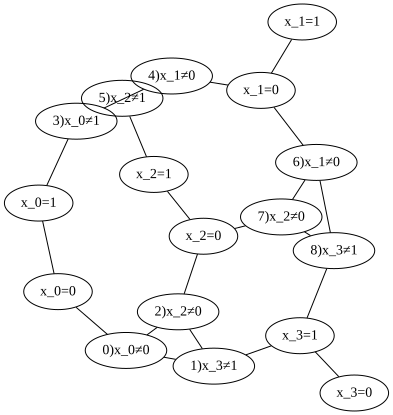

In [57]:
SAT2IS_(φ)

In [58]:
# same reduction but taking care of colors and keeping track what happens to an assignment
def SAT2IS(φ,x=""):
    S = []
    n = numvars(φ) 
    G =Graph(engine='neato')
    for i in range(n):
        u = f"x_{i}=0"
        v = f"x_{i}=1"
        G.node(u,style='filled',fillcolor=('red' if x and x[i]=="0" else 'green'))
        G.node(v,style='filled',fillcolor=('red' if x and x[i]=="1" else 'green'))
        if x: S.append(u if x[i]=='0' else v)
        G.edge(u,v,len='1')
    
    def nodename(v):
        return ((v[1:],"≠1") if v[0]=="¬" else (v,"≠0"))
    
    cnum = 0
    for C in getclauses(φ):
        lastv = None
        found = False
        for v in C:
            (var,cond) = nodename(v)
            name = f'{cnum}){var}{cond}'
            cnum += 1
            color = 'lightblue'
            if x and (not found) and x[int(var[2:])]!=cond[1]:
                found = True
                color = 'red'
                S.append(name)
            G.node(name,label=var+cond,style='filled',fillcolor=color)
            if lastv: G.edge(lastv,name,len='1')
            lastv = name
            G.edge(name,var+"="+cond[1],len='1.7')
        G.edge(str(cnum-3)+")"+"".join(nodename(C[0])),lastv,len='1')
    
    return (G if not x else (G,S))

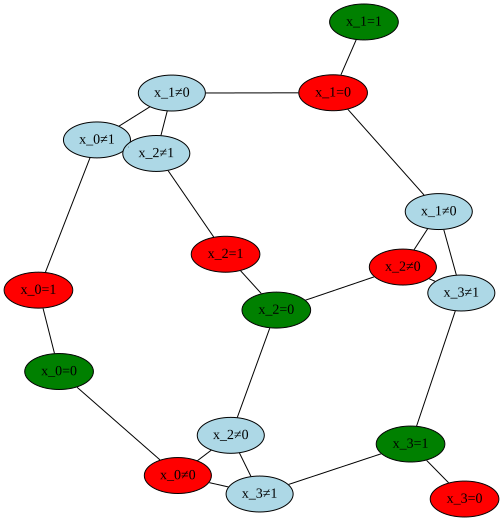

In [59]:
SAT2IS(φ,"1010")[0]

In [60]:
# same reduction as above but handling colors and showing the resulting cut when the original graph has independent set
def IS2MAXCUT(G,I=[]):
    G =nxgraph(G)
    S = []
    H =Graph(engine='sfdp',graph_attr={'overlap':'false'})
    H.node("source",style='filled',fillcolor='blue')
    S.append("source")
    for v in G.nodes():
        color = ('red' if I and v in I else 'lightblue')
        H.node(v,style='filled',fillcolor=color)
        ecol = 'black'
        pwidth = '1'
        if I and v in I: 
            S.append(v)
            ecol = 'red'
            pwidth = '2'
        H.edge("source",v,len="2",color=ecol,penwidth=pwidth) 
    
    j =0
    for (u,v) in G.edges():
        g1 = "e"+str(j)+"a"
        g2 = "e"+str(j)+"b"
        c1 = 'green'
        c2 = 'green'
        if I and (not u in I):
            c1 = 'red'
            S.append(g1)
        if I and (not v in I):
            c2 = 'red'
            S.append(g2)
        gadget = Graph("gadget"+str(j))
        gadget.node(g1,style='filled',fillcolor=c1)
        gadget.node(g2,style='filled',fillcolor=c2)
        gadget.edge(g1,g2,len="1",color=('red' if (g1 in S) != (g2 in I) else 'black'), penwidth=('2' if (g1 in S) != (g2 in I) else '1'))
        gadget.edge(u,g1,len="1", color=('red' if (g1 in S) != (u in I) else 'black'),penwidth =('2' if (g1 in S) != (u in S) else '1')  )
        gadget.edge(v,g2,len="1", color=('red' if (g2 in S) != (v in I) else 'black'),penwidth= ('2' if (g2 in S) != (v in S) else '1') )
        
        H.subgraph(gadget)
        H.edge(g1,"source",color=('red' if (g1 in S)  else 'black'),penwidth=('2' if (g1 in S)  else '1')) # ,len="2.5"
        H.edge(g2,"source",color=('red' if (g2 in S)  else 'black'),penwidth= ('2' if (g2 in S)  else '1') )
        j +=1
        
    
    return (H,S) if I else H

## Putting everything together

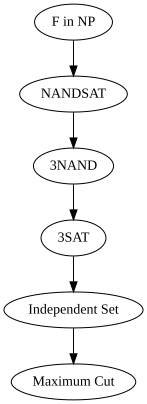

In [61]:
combined

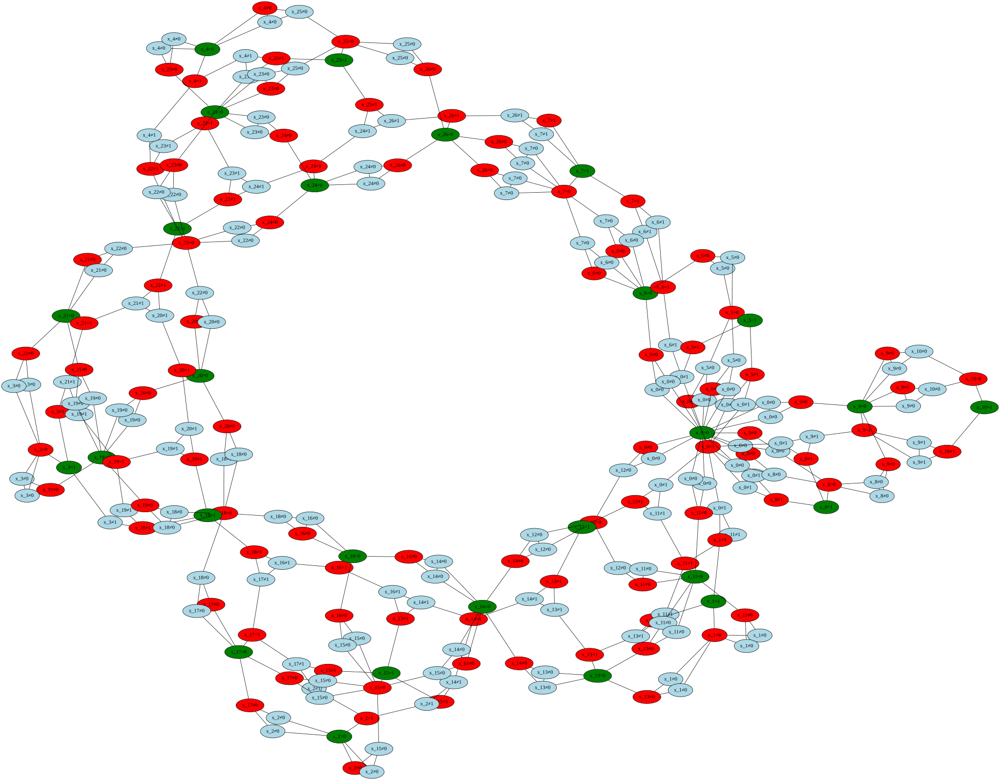

In [62]:
SAT2IS(*NAND23SAT(*NANDSAT23NAND(pref(xor5),"10101")))[0]

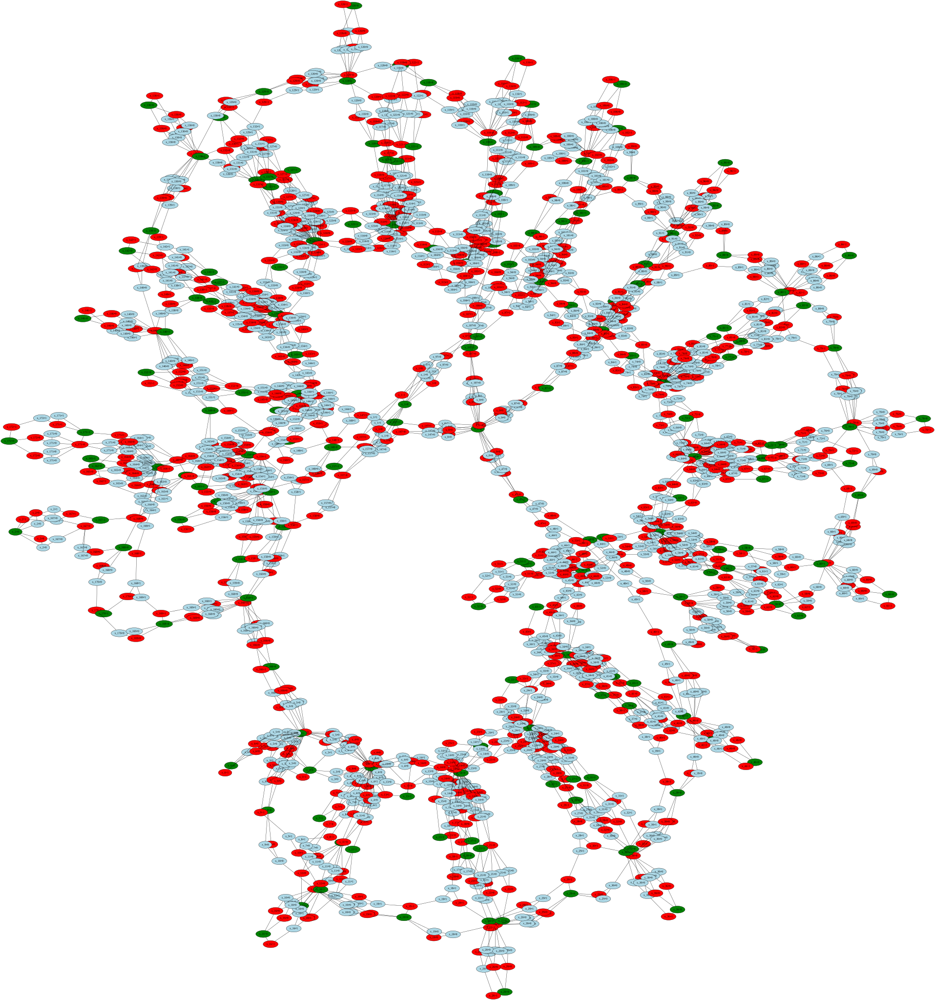

In [63]:
SAT2IS(*NAND23SAT(*NANDSAT23NAND(*NP2NANDSAT(andpp,17,3,"11","111"))))[0]

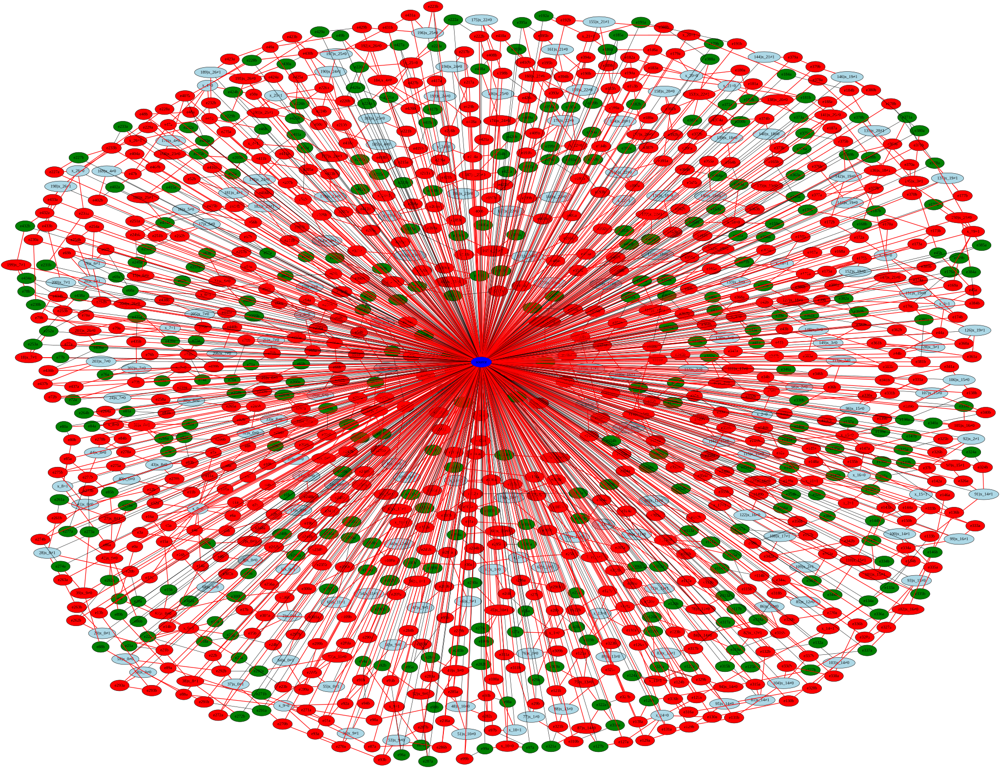

In [64]:
IS2MAXCUT(*SAT2IS(*NAND23SAT(*NANDSAT23NAND(pref(xor5),"10101"))))[0]

In [65]:
IS2MAXCUT(*SAT2IS(*NAND23SAT(*NANDSAT23NAND(*NP2NANDSAT(andpp,17,3,"11","101")))))[0]

In [66]:
parity = r'''
tmpa  := seen_i NAND seen_i
tmpb  := x_i NAND tmpa
val   :=  tmpb NAND tmpb
ns   := s   NAND s
y_0  := ns  NAND ns
u    := val NAND s
v    := s   NAND u
w    := val NAND u
s    := v   NAND w
seen_i := zero NAND zero  
stop := validx_i NAND validx_i
loop := stop     NAND stop
'''

In [67]:
draw_graph(prog,"both")

NameError: name 'prog' is not defined

> <ipython-input-67-21e97c68691b>(1)<module>()
----> 1 draw_graph(prog,"both")

ipdb> q


### Utility code (run this first)

In [ ]:
%pylab

In [ ]:
from IPython.display import Image
from IPython.core.display import HTML 

In [ ]:
import graphviz
from graphviz import Graph
from graphviz import Digraph

In [ ]:
import networkx as nx

import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

import warnings
warnings.filterwarnings("ignore")

import math


In [ ]:
import pydotplus

def nxgraph(G):
    P = pydotplus.graph_from_dot_data(G.source)
    return nx.drawing.nx_pydot.from_pydot(P)


In [ ]:
# import matplotlib.cbook
# warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)

def NAND2Graph(P):
    n = max([int(var[2:]) for var in P.split() if var[:2]=='x_' ])+1 # no of inputs
    m = max([int(var[2:]) for var in P.split() if var[:2]=='y_' ])+1 # no of outputs
    nodes = {}
    
    def uniquenode(v):
        idx = nodes.setdefault(v,-1)
        nodes[v] = nodes[v]+1
        return v+(" "*(idx+1))
    
    def lastnode(v):
        idx = nodes.get(v,0)
        return v+(" "*idx)
        
    
    G = nx.DiGraph()
    for line in P.split('\n'):
        if not line or line[0]=='#' or line[0]=='//': continue # ignore empty and commented out lines
        (var1,assign,var2,op,var3) = line.split()
        var1 = uniquenode(var1)
        var2 = lastnode(var2)
        var3 = lastnode(var3)
        G.add_node(var1)
        G.add_edge(var2,var1)
        G.add_edge(var3,var1)
    
    return [G, [lastnode("y_"+str(j)) for j in range(m)]]
 
    
def EVALgraph(L,n,m,x):
    t = max([max(triple) for triple in L])+1
    s = len(L)
    
    avars = [0]*t
    avars[:n]=x
    values = [0]*(n+s+m)
    values[:n]=x

    l=0
    for (a,b,c) in L:
        avars[a] =  1-avars[b]*avars[c]
        values[l+n] = avars[a]
        l+=1
    
        
    y = avars[t-m:t]
    values[n+s:n+s+m] = y
    
    
    G = nx.DiGraph()
    
    
    def getnode(i):
        if i<n:
            return 'x_'+ str(i)+'='+str(values[i])
        elif i<n+s:
            return 'l_'+str(i-n)+"="+str(values[i])
        else:
            return 'y_'+str(i-n-s)+"="+str(values[i])
    
    lines = [getnode(i) for i in range(n+s)] 
    
    def last_written(var,l):
        if var<n:
            return var
        z = -1
        for i in range(l):
            if L[i][0]==var:
                z = i+n
        return z
    

    for node in lines:
        G.add_node(node)
    
    
    l = 0
    for (a,b,c) in L:
        in1 = last_written(b,l)
        in2 = last_written(c,l)
        
        if in1>=0:
            G.add_edge(lines[in1],lines[l+n])
        if in2>=0:
            G.add_edge(lines[in2],lines[l+n])
        l += 1
    
    for j in range(m):
        G.add_edge(lines[last_written(t-m+j,s)],getnode(n+s+j))
        
    return [G, [getnode(n+s+j) for j in range(m)]]

def draw_eval(prog,s,pruned="none"):
    x = [int(a) for a in s]
    [n,m,t] = params(prog)
    L =  triples(prog,n,m,t)
    [G,O] = EVALgraph(L,n,m,x)
    if pruned != "none":
        prune(G,O,pruned)
    return draw_DAG(G)
    

def draw_DAG(G):
    print(str(len(G.nodes()))+" nodes")
    D = nx.drawing.nx_pydot.to_pydot(G)
    png_str = D.create_png()
    return Image(data=png_str)


def draw_graph(prog,pruned="none"):
    [G,O] = NAND2Graph(prog)
    if pruned != "none":
        prune(G,O,pruned)
    return draw_DAG(G)

In [ ]:
def prune(G,O,pruned):
    
    if pruned in ["sinks","both"]:
        found = True
        while found:
            found = False
            nodes = G.nodes()
            for n in nodes:
                if len(G.successors(n))==0 and not(n in O):
                    G.remove_node(n)
                    found = True
                
    if pruned in ["merge","both"]:    
        found = True
        while found:
            found = False
            for n in G.nodes():
                for np in G.nodes():
                    if (n != np) and (np[0]!='x') and (set(G.predecessors(n))== set(G.predecessors(np))):
                        s = G.successors(np)
                        for a in s:
                            G.add_edge(n,a)
                        G.remove_node(np)
                        found = True
                        break
                if found:
                    break
    return G

In [ ]:
import networkx as nx

import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

import warnings
warnings.filterwarnings("ignore")

# import matplotlib.cbook
# warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)

def NAND2Graph(P):
    n = max([int(var[2:]) for var in P.split() if var[:2]=='x_' ])+1 # no of inputs
    m = max([int(var[2:]) for var in P.split() if var[:2]=='y_' ])+1 # no of outputs
    nodes = {}
    
    def uniquenode(v):
        idx = nodes.setdefault(v,-1)
        nodes[v] = nodes[v]+1
        return v+(" "*(idx+1))
    
    def lastnode(v):
        idx = nodes.get(v,0)
        return v+(" "*idx)
        
    
    G = nx.DiGraph()
    for line in P.split('\n'):
        if not line or line[0]=='#' or line[0]=='//': continue # ignore empty and commented out lines
        (var1,assign,var2,op,var3) = line.split()
        var1 = uniquenode(var1)
        var2 = lastnode(var2)
        var3 = lastnode(var3)
        G.add_node(var1)
        G.add_edge(var2,var1)
        G.add_edge(var3,var1)
    
    return [G, [lastnode("y_"+str(j)) for j in range(m)]]
 
    
def EVALgraph(L,n,m,x):
    t = max([max(triple) for triple in L])+1
    s = len(L)
    
    avars = [0]*t
    avars[:n]=x
    values = [0]*(n+s+m)
    values[:n]=x

    l=0
    for (a,b,c) in L:
        avars[a] =  1-avars[b]*avars[c]
        values[l+n] = avars[a]
        l+=1
    
        
    y = avars[t-m:t]
    values[n+s:n+s+m] = y
    
    
    G = nx.DiGraph()
    
    
    def getnode(i):
        if i<n:
            return 'x_'+ str(i)+'='+str(values[i])
        elif i<n+s:
            return 'l_'+str(i-n)+"="+str(values[i])
        else:
            return 'y_'+str(i-n-s)+"="+str(values[i])
    
    lines = [getnode(i) for i in range(n+s)] 
    
    def last_written(var,l):
        if var<n:
            return var
        z = -1
        for i in range(l):
            if L[i][0]==var:
                z = i+n
        return z
    

    for node in lines:
        G.add_node(node)
    
    
    l = 0
    for (a,b,c) in L:
        in1 = last_written(b,l)
        in2 = last_written(c,l)
        
        if in1>=0:
            G.add_edge(lines[in1],lines[l+n])
        if in2>=0:
            G.add_edge(lines[in2],lines[l+n])
        l += 1
    
    for j in range(m):
        G.add_edge(lines[last_written(t-m+j,s)],getnode(n+s+j))
        
    return [G, [getnode(n+s+j) for j in range(m)]]

def draw_eval(prog,s,pruned="none"):
    x = [int(a) for a in s]
    [n,m,t] = params(prog)
    L =  triples(prog,n,m,t)
    [G,O] = EVALgraph(L,n,m,x)
    if pruned != "none":
        prune(G,O,pruned)
    return draw_DAG(G)
    

def draw_DAG(G):
    print(str(len(G.nodes()))+" nodes")
    D = nx.drawing.nx_pydot.to_pydot(G)
    png_str = D.create_png()
    return Image(data=png_str)

def display_graph(G):
    print(str(len(G.nodes()))+" nodes")
    D = nx.drawing.nx_pydot.to_pydot(G)
    png_str = D.create_png()
    return Image(data=png_str)



def draw_graph(prog,pruned="none"):
    [G,O] = NAND2Graph(prog)
    if pruned != "none":
        prune(G,O,pruned)
    return draw_DAG(G)

def prune(G,O,pruned):
    
    if pruned in ["sinks","both"]:
        found = True
        while found:
            found = False
            nodes = G.nodes()
            for n in nodes:
                if len(G.successors(n))==0 and not(n in O):
                    G.remove_node(n)
                    found = True
                
    if pruned in ["merge","both"]:    
        found = True
        while found:
            found = False
            for n in G.nodes():
                for np in G.nodes():
                    if (n != np) and (np[0]!='x') and (set(G.predecessors(n))== set(G.predecessors(np))):
                        s = G.successors(np)
                        for a in s:
                            G.add_edge(n,a)
                        G.remove_node(np)
                        found = True
                        break
                if found:
                    break
    return G